In [1]:
#importing modules
import numpy as np
import matplotlib.pyplot as plt; plt.ioff()

nan= float('nan')
pi= np.pi
e= np.e

c= 3e8
h= 6.62*10**-34
k= 1.38*10**-23

%load_ext autoreload
%autoreload 2

import QubeSpec as IFU
import QubeSpec.Plotting as emplot
import QubeSpec.Fitting as emfit


True


# Initializing the QubeSpec and preparing the data for fitting

In order to make things easier for the user, I writen a simple dictionary called QubeSpec_setup. You can define all the necessary variables in this dictionary and then just run all the cells. Although there is a short description next to it, there will be full explanation of each variable accompanying the each function. 


In [2]:
# Lets define additional info
PATH='/Users/jansen/My Drive/Astro/'

QubeSpec_setup = {}
QubeSpec_setup['z'] = 6.851 # Redshift of the object 
QubeSpec_setup['ID'] = 'COS30_R2700' # Name of the object
QubeSpec_setup['instrument'] = 'NIRSPEC_IFU_fl' # Name of the instrument - KMOS, SINFONI, NIRSPEC_IFU (when original units Fnu from pipeline), NIRSPEC_IFU_fl (for GTO pipeline Flambda)
QubeSpec_setup['band'] = 'R2700' # Or PRISM, doesnt matter for JWST - For KMOS and SINFONI it should H or K or HK or YJ or Hsin, Ksin for SINFONI
QubeSpec_setup['save_path'] = PATH+'COS30_IFS/Saves/' # Where to save all the info. 
QubeSpec_setup['file'] = PATH+'COS30_IFS/Data/COS30-COS-6.80-S_jw1217_o007_ff_px0.05_drizzle_ODfde95.0_VSC_MRC_MSA_EMSA_m2ff_xyspikes96_CTX1068.pmap_v1.8.2_g395h-f290lp_cgs_s3d.fits'# Path to the Data Cube
QubeSpec_setup['norm'] = 1e-15 # Normalization to make the spectrum around 1

QubeSpec_setup['average_error'] = 9e-22 # average error cube value 
QubeSpec_setup['mask_channels'] = []  # any particular channels to mask - with JWST not necessarily 

QubeSpec_setup['Source_mask'] = PATH+'COS30_IFS/Data/R2700_source.fits' # path to find the source mask to mask the source during background subtraction - Can be None but then you have to supply wavelength range around some emission line to construct a line map and let sextractor create the mask
QubeSpec_setup['line_map_wavelength'] = [3.92,3.94] # Wavelength range used to create a line map for source detection - only used if 'Source_mask' is None

QubeSpec_setup['Object_center'] = [59,50] # X,Y - center of the object 
QubeSpec_setup['Aperture_extraction'] = 0.2 # radius of the aperture to extract the the 1D spectrum
# Error stuff - explained below
QubeSpec_setup['err_range']=[3.95,4.05, 5,5.1] # err ranges for renormalising the error extension
QubeSpec_setup['err_boundary'] = 4.1 # where to switch - location of the detector gap

# Spatial Stuff - explained below
QubeSpec_setup['Spaxel_mask'] = PATH+'COS30_IFS/Data/R2700_source_mask.fits' # which spaxel to fit in spaxel-by-spaxel fitting - source mask and Spaxel mask can be the same
QubeSpec_setup['ncpu'] = 8 # number of cores to use for 



## Initalize the cube

Here we initialize the Cube class and load the cube. We also perform few minor preps. You will need:

1) Full_path = path to the fits cube 
2) z - redshift of the source
3) ID - name of the source. For example: COS-3018_R2700
4) flag - Instrument glag - Options: 'KMOS', 'SINFONI', 'NIRSPEC', 'NIRSPEC_fl' and 'MIRI'
5) savepath - When do you save all of the products. 
6) Band - For flag - 'NIRSPEC' or 'NIRSPEC_fl' just go 'NIRSPEC' , 'KMOS': 'YJ', 'H', 'K'; 'SINFONI': 'Ysin', 'Hsin', 'Ksin'
7) norm - normalization of the cube to make the integrated spectrum ~0.5-5 ish. The code just handles things better when the spectra are around 1. 

In [3]:
Cube = IFU.Cube( Full_path = QubeSpec_setup['file'],\
                z =  QubeSpec_setup['z'], \
                ID =  QubeSpec_setup['ID'] ,\
                flag =  QubeSpec_setup['instrument'] ,\
                savepath = QubeSpec_setup['save_path'] ,\
                Band = 'NIRSPEC',\
                norm = QubeSpec_setup['norm'])


## Masking

Here we are going to make some some obvious outliers. In JWST data, they have often obvious spikes in the error extension. By defining typical value of the error extension and some scale threshold (10 000) seems good we can caluclate a value above which the code will flag any outliers. We can also give a list of indices representing channels that need some manual masking. 

In [4]:
threshold = QubeSpec_setup['average_error']/Cube.flux_norm*1e4
Cube.mask_JWST(0, threshold= threshold, spe_ma=QubeSpec_setup['mask_channels'])


## Background Subtraction

When dealing with JWST data, it is important to perform the background subtraction. This algorithm is courtesy of Francesco D'Eugenio. The code estimates the median background in each channel, masking out any pixels that are not covered by the cube (the edges) and the source - see later. The Median background is estimate across filter_size (default 5,5, but can be changed). Once the background cube is estimated, it is smoothened by a median filter (with wave_smooth =25 channels, another free parameter). 

There are currently two ways of dealing with the source mask: 
1) You supply the actual source mask from QFits view. 

2) You let the code find the object using the source etxractor. At that point, please supply the wave_range =[X,Y], which will be used to collapse the cube to create a line map. Furthermore, you can change the detection_threshold=3 for the sextractor. 

Eitherway, at the end you will get a background (Cube.background) and a subtracted flux cube (Cube.flux)

Loading source mask from file
Using supplied source mask


1932it [00:03, 778.13it/s]

1827 All boxes contain > 44.1 (10.0 percent per box) masked pixels (or all are completely masked). Please check your data or increase "exclude_percentile" to allow more boxes to be included.
1828 All boxes contain > 44.1 (10.0 percent per box) masked pixels (or all are completely masked). Please check your data or increase "exclude_percentile" to allow more boxes to be included.
1829 All boxes contain > 44.1 (10.0 percent per box) masked pixels (or all are completely masked). Please check your data or increase "exclude_percentile" to allow more boxes to be included.
1830 All boxes contain > 44.1 (10.0 percent per box) masked pixels (or all are completely masked). Please check your data or increase "exclude_percentile" to allow more boxes to be included.
1831 All boxes contain > 44.1 (10.0 percent per box) masked pixels (or all are completely masked). Please check your data or increase "exclude_percentile" to allow more boxes to be included.
1832 All boxes contain > 44.1 (10.0 percent p

3610it [00:05, 620.05it/s]


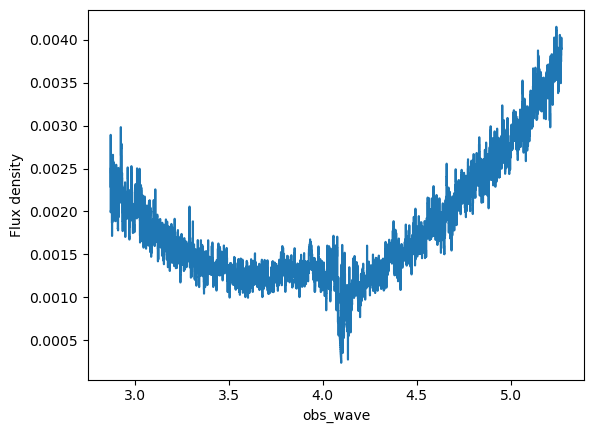

In [5]:
if any(QubeSpec_setup['Source_mask']) !=None:
    print('Loading source mask from file')
    source_bkg = IFU.sp.QFitsview_mask(QubeSpec_setup['Source_mask']) # Loading background mask
Cube.background_subtraction( source_mask=source_bkg, wave_range=QubeSpec_setup['line_map_wavelength'], plot=1) # Doing background subtraction

plt.show()

## Saving the class and resume

At any point you can save the Cube class with save(file_path) function. Later on you can Initialize the empty class again and then load it with load(file_path)

In [6]:
Cube.save('/Users/jansen/Test.txt') # 

Cube2 = IFU.Cube()
Cube2.load('/Users/jansen/Test.txt')


# Extracting your first spectrum

In order to extract a specturm we first collpase the cube into a white light image using collpase_white function. Then we find the center of the galaxy from the continuum. With KMOS or seeing limited SINFONI observations, we could use 2D Gaussian in order to find the center of an object. With NIRSpec and SINFONI AO, galaxies can be quite clumy and hence it often fails. Therefore I would suggest using the manual= [x,y] keyword in order to define it yourself. 

Next we select and collapse the aperture using the D1_spectra_collapse with he following keywords:
1) radius of the extraction circle (units of arcseconds)
2) add_save = string - name appended to the basic file name when saving the spectrum
3) err_range - list of 2 or 4 numbers. This are wavelength boundries used (read full explanation below)
4) boundary - if you use 4 numbers in err_range, boundary will be where the error calc will be split.
5) plot_err = 1/0 - do you want to plot the comparison of the errors estimated in this code and the ones from the NIRSpec extension 

For NIRSpec spectra:
Unfortunately, we cannot use the error extension from the pipeline as there is scaling issue at hand. However, the error extension maintains all of the correlation between channels. Because of that, we estimate the error from the error extension and then compared to the median value of this error array to the standard deviation of the continuum. The err_range values are defining the wavelength region that is used to estimate the standard deviation of the spectrum. There are two options of supplying the right info:

a) err_range = [lower, upper] - in this case yo the upper and lower wavelength range of emission line free part of the spectrum. The code will estimate the standard deviation of that part to the error extension and scale it. 

b) err_range = [lower_a, upper_a, lower_b, upper_b] and boundary=4.1 - in this case yo the upper and lower wavelength range of TWO seperate emission line free sections of the spectrum. The code will estimate the standard deviation of that part to the error extension and scale it for each section. The boundary value is the wavelength value where you apply the the lower or upper scaling factor. Example below:

err_range=[3.95,4.05, 5,5.1] and boundary=4.1

The code will estimate the standard deviation from the spectrum and hence the scaling factor for two section:
3.95-4.05 and  5.-5.1. It will then applying the two scaling factor to error extension with lambda<4.1 and lambda>4.1. 

So the err_range should be section of spectra without any emission lines. The boundary should be somewhere between emission lines of interest of in case of R2700 - the detector gap



Center of cont [59. 50.]
Extracting spectrum from diameter 0.4 arcseconds
Pixel scale: 20.0
radius  4.0
NIRSPEC mode of error calc
Error rescales are:  4.488145010846023 3.8630008408327177


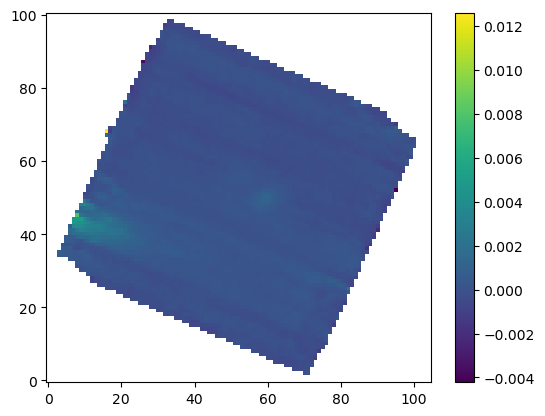

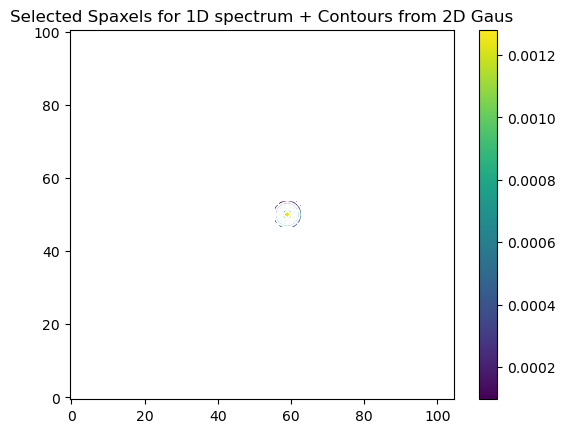

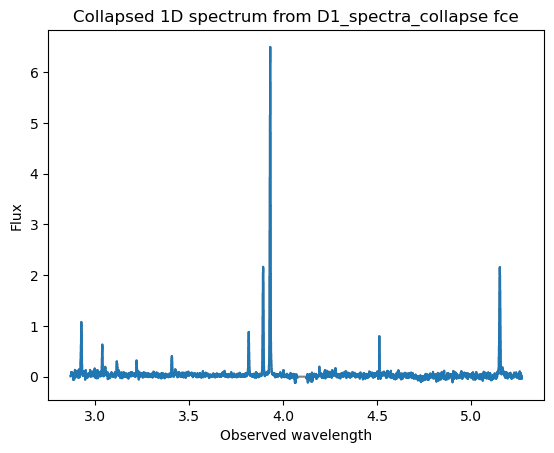

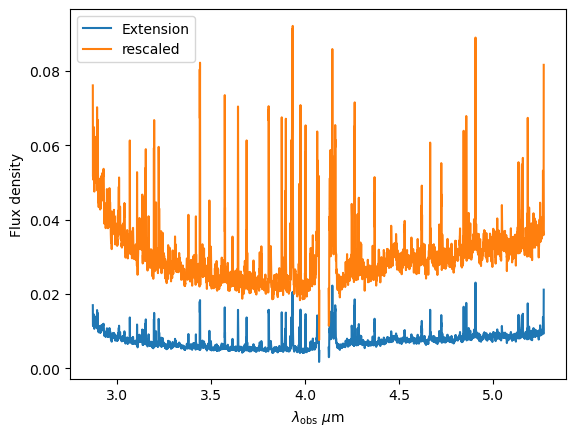

In [6]:
Cube.collapse_white(1)

Cube.find_center(1, manual=QubeSpec_setup['Object_center'])
Cube.D1_spectra_collapse(1, addsave='',rad=QubeSpec_setup['Aperture_extraction'], err_range=QubeSpec_setup['err_range'], boundary=QubeSpec_setup['err_boundary'], plot_err=1)
plt.show()





## Plotting spectrum

Lets just have a look at all the emission lines in the spectrum.

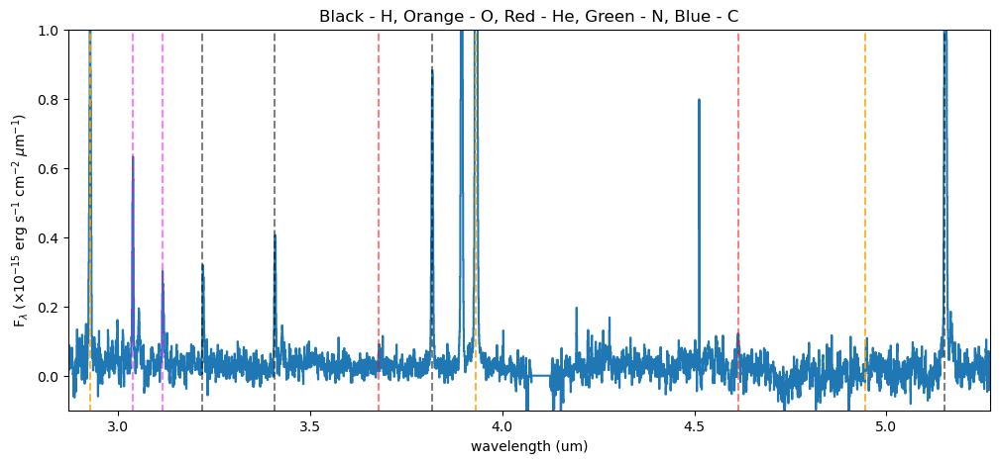

In [7]:
f, ax = plt.subplots(1, figsize=(12,5))

ax.plot(Cube.obs_wave, Cube.D1_spectrum, drawstyle='steps-mid')

ylow = -0.2
yhig = 10

ax.vlines(0.5008*(1+Cube.z),ylow,yhig, linestyle='dashed',color='orange', alpha=0.8)
ax.vlines(0.3727*(1+Cube.z),ylow,yhig, linestyle='dashed',color='orange', alpha=0.8)
ax.vlines(0.6300*(1+Cube.z),ylow,yhig, linestyle='dashed',color='orange', alpha=0.8)


ax.vlines(0.6563*(1+Cube.z),ylow,yhig, linestyle='dashed',color='k', alpha=0.5)
ax.vlines(0.4861*(1+Cube.z),ylow,yhig, linestyle='dashed',color='k', alpha=0.5)
ax.vlines(0.4340*(1+Cube.z),ylow,yhig, linestyle='dashed',color='k', alpha=0.5)
ax.vlines(0.4100*(1+Cube.z),ylow,yhig, linestyle='dashed',color='k', alpha=0.5)

ax.vlines(0.1215*(1+Cube.z),ylow,yhig, linestyle='dashed',color='k', alpha=0.5)

ax.vlines(0.6731*(1+Cube.z),ylow,yhig, linestyle='dashed',color='k', alpha=0.5)

ax.vlines(0.3869*(1+Cube.z),ylow,yhig, linestyle='dashed',color='magenta', alpha=0.5)
ax.vlines(0.3968*(1+Cube.z),ylow,yhig, linestyle='dashed',color='magenta', alpha=0.5)
ax.vlines(0.2424*(1+Cube.z),ylow,yhig, linestyle='dashed',color='magenta', alpha=0.5)


ax.vlines(0.4686*(1+Cube.z),ylow,yhig, linestyle='dashed',color='red', alpha=0.5)
ax.vlines(0.5877*(1+Cube.z),ylow,yhig, linestyle='dashed',color='red', alpha=0.5)

ax.set_title('Black - H, Orange - O, Red - He, Green - N, Blue - C')

ax.set_xlabel('wavelength (um)')
ax.set_ylabel(r'F$_\lambda$ ($\times 10^{-15}$ erg s$^{-1}$ cm$^{-2}$ $\mu$m$^{-1}$)')

ax.set_xlim(min(Cube.obs_wave), max(Cube.obs_wave))
ax.set_ylim(-0.1, 1)
plt.show()

## Simple fit

Ok so there will be/is a full tutorial/jupyer notebook, but I will briefly explain it here. Under the hood, QubeSpec is using emcee to fit the lines. As such you need to give it some model, initial conditions and priors. However, I written some methods in the QubeSpec and emfit.Fitting classes that do all of the work. However you can still change the priors by supplying new updated priors in a dictionary form. The shape of the dictionary should be as such:

priors = {}
priors[ 'name of the variable'] = [ initial_value or 0, 'shape of the prior', paramters of the prior]

'name of the variable' - I will give a full list of variable for each models below.

intial value - inital value for the fit - if you want the code to decide put 0

'shape of the prior' - 'uniform', 'loguniform' (uniform in logspace), 'normal', 'normal_hat' (truncated normal distribution)

Example below: 

In [8]:
dvmax = 1000/3e5*(1+Cube.z)
dvstd = 200/3e5*(1+Cube.z)
priors = {}
priors['z'] = [Cube.z,'normal_hat', Cube.z, dvstd, Cube.z-dvmax, Cube.z+dvmax]
priors['cont']=[0.1,'loguniform', -3,1]
priors['cont_grad']=[0.2,'normal', 0,0.2]
priors['Hal_peak']=[5.,'loguniform', -3,1]
priors['NII_peak']=[0.4,'loguniform', -3,1]
priors['Nar_fwhm']=[300,'uniform', 200,900]
priors['OIII_peak']=[6.,'loguniform', -3,1]
priors['OI_peak']=[1.,'loguniform', -3,1]
priors['HeI_peak']=[1.,'loguniform', -3,1]
priors['HeII_peak']=[1.,'loguniform', -3,1]
priors['Hbeta_peak']=[2,'loguniform', -3,1]
priors['Hgamma_peak'] = [1.,'loguniform',-3,1]
priors['Hdelta_peak'] = [0.5,'loguniform',-3,1]
priors['NeIII_peak'] = [0.3,'loguniform',-3,1]
priors['OII_peak'] = [0.4,'loguniform',-3,1]
priors['OII_rat']=[1,'normal_hat',1,0.2, 0.2,4]
priors['OIIIaur_peak']=[0.2,'loguniform', -3,1]

# For variables:
labels= ['z', 'cont','cont_grad',  'Hal_peak', 'NII_peak', 'OIII_peak', 'Hbeta_peak','Hgamma_peak', 'Hdelta_peak','NeIII_peak','OII_peak','OII_rat','OIIIaur_peak', 'HeI_peak','HeII_peak', 'Nar_fwhm']

In the few section I will describe fitting using these predefined models and how you can change some inputs.

For each function you can also chnage:

N - number of iterations in a chain (default= 6000)
progress - default True (to see the progress bar)


### Fitting Halpha only
With this function you can fit the collapse 1D spectrum that you exctracted earlier. The main key word is models

models -  Single_only, Outflow_only, BLR_only, BLR, Outflow, QSO_BKPL

which changes if you fit a single model:

'Single_only' - single gaussian to Halpha, both [NII] and both [SII] - name of the free parameters: ['z', 'cont','cont_grad', 'Hal_peak', 'NII_peak', 'Nar_fwhm', 'SIIr_peak', 'SIIb_peak']

'Outflow_only' - single gaussian to Halpha, both [NII] and both [SII] and additional gaussians to Halpha + [NII] to model an outflow - name of the free parameters: ['z', 'cont','cont_grad', 'Hal_peak', 'NII_peak', 'Nar_fwhm', 'SIIr_peak', 'SIIb_peak', 'Hal_out_peak', 'NII_out_peak', 'outflow_fwhm', 'outflow_vel']

'BLR_only' - single gaussian to Halpha, both [NII] and both [SII] and additional gaussians to Halpha to model an BLR  - name of the free parameters ['z', 'cont','cont_grad', 'Hal_peak','BLR_Hal_peak', 'NII_peak', 'Nar_fwhm', 'BLR_fwhm', 'zBLR', 'SIIr_peak', 'SIIb_peak']


'BLR' and 'Outflow' models fit either 'Single_only' and 'BLR_only' or 'Single_only' and 'Outflow_only' and decides which is the best model for the spectrum. 

100%|██████████| 6000/6000 [01:06<00:00, 90.53it/s]


Delta BIC 606.1341804007398  


SNR hal  47.79767926901363
SNR SII  nan


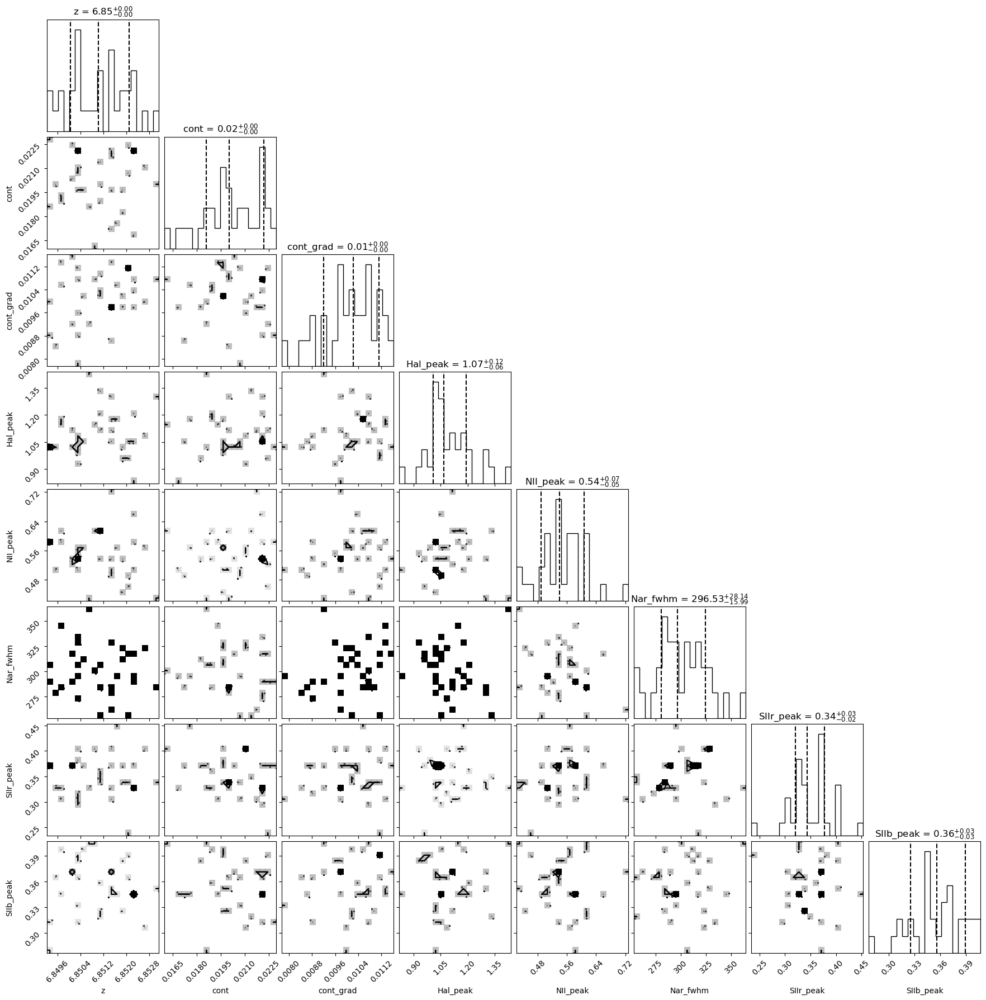

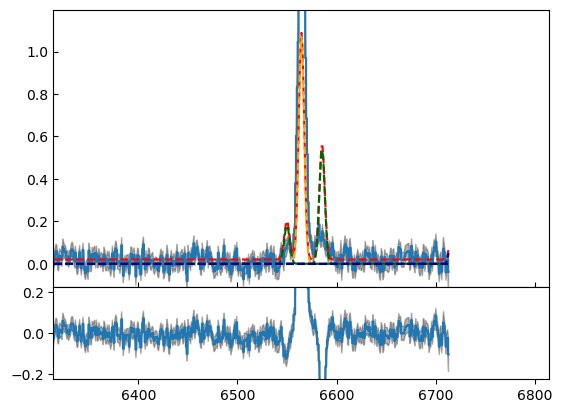

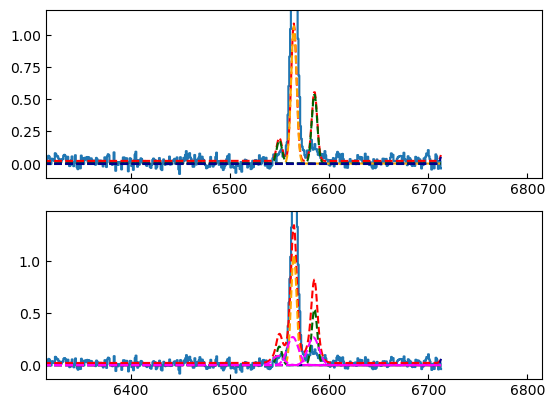

In [9]:
Cube.fitting_collapse_Halpha(models='Outflow', plot=1)
plt.show()

### Fitting [OIII]
simple = 0 or 1 when 1, we tie the Hbeta and OIII kinematics together. Please just use simple = 1 - Unless fitting high luminosity AGN and when you get a decent fit the Hbeta still looks wonky. 


models -  Single_only, Outflow_only, BLR_only, BLR, Outflow, QSO_BKPL

which changes if you fit a single model:

'Single_only' - single gaussian to both [OIII] and [Hbeta] - name of the free parameters: ['z', 'cont','cont_grad', 'OIII_peak', 'Nar_fwhm', 'Hbeta_peak'] if simple=1

'Outflow_only' - single gaussian to both [OIII] and Hbeta  and additional gaussians to [OIII]+Hbeta to model an outflow - name of the free parameters: ['z', 'cont','cont_grad', 'OIII_peak', 'OIII_out_peak', 'Nar_fwhm', 'outflow_fwhm', 'outflow_vel', 'Hbeta_peak', 'Hbeta_out_peak'] if simple=1


'Outflow' - fits both above.

BLR models TBD

100%|██████████| 6000/6000 [00:42<00:00, 140.30it/s]


Delta BIC -214.24900159860823  
BICM 493.3614368199665
['name', 'z', 'cont', 'cont_grad', 'OIII_peak', 'OIII_out_peak', 'Nar_fwhm', 'outflow_fwhm', 'outflow_vel', 'Hbeta_peak', 'Hbeta_out_peak', 'popt']
173.29525787566877
48.12453868132517


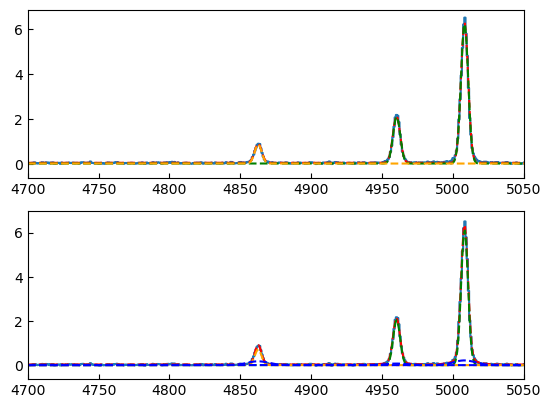

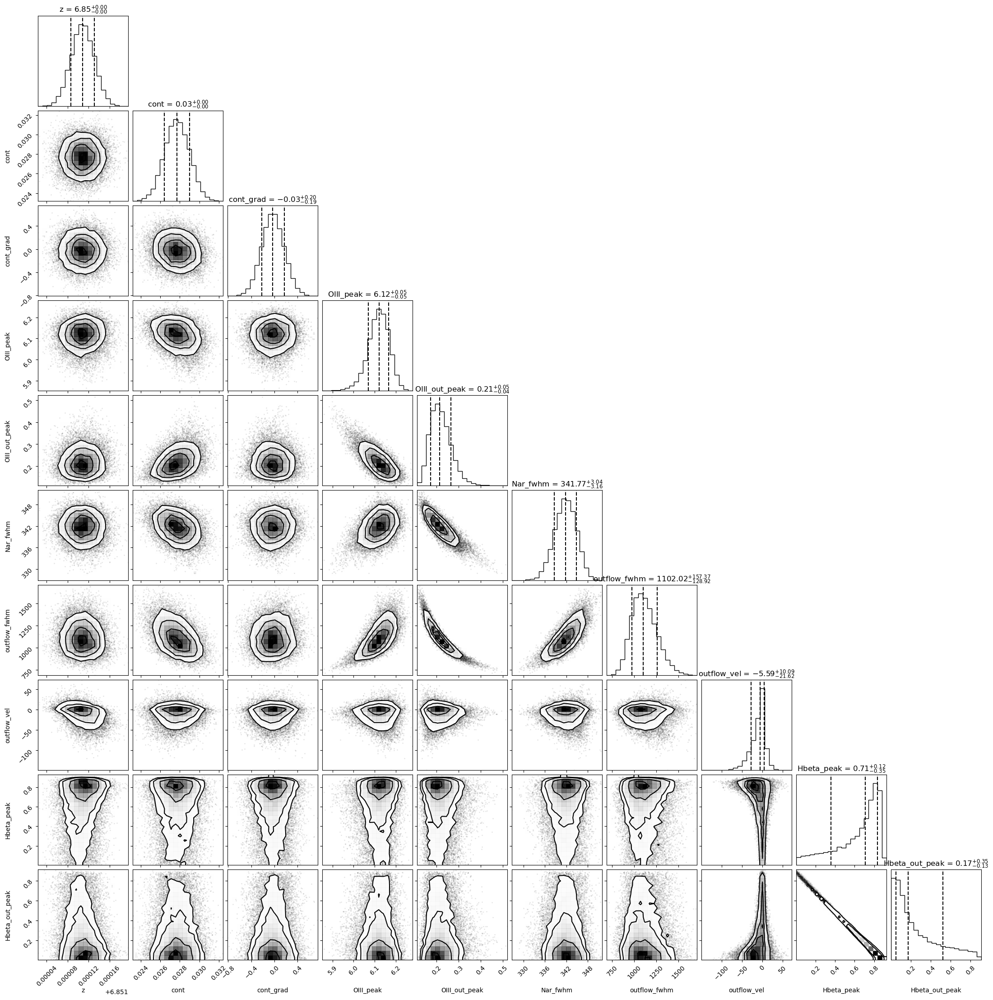

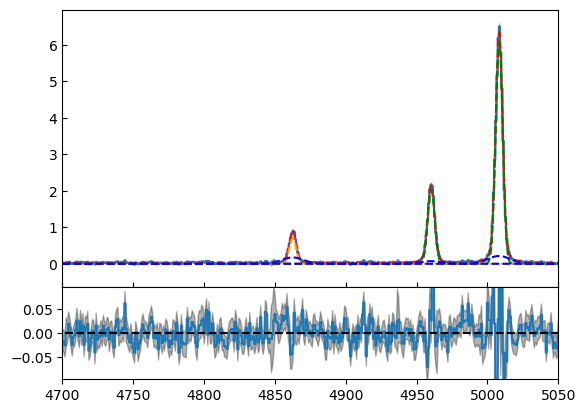

In [25]:
# B14 style
Cube.fitting_collapse_OIII(models='Outflow',simple=1, plot=1)
plt.show()

### Fitting Halpha + [OIII]

models - Single_only, Outflow_only, BLR, QSO_BKPL, BLR_simple

100%|██████████| 6000/6000 [01:07<00:00, 88.63it/s]


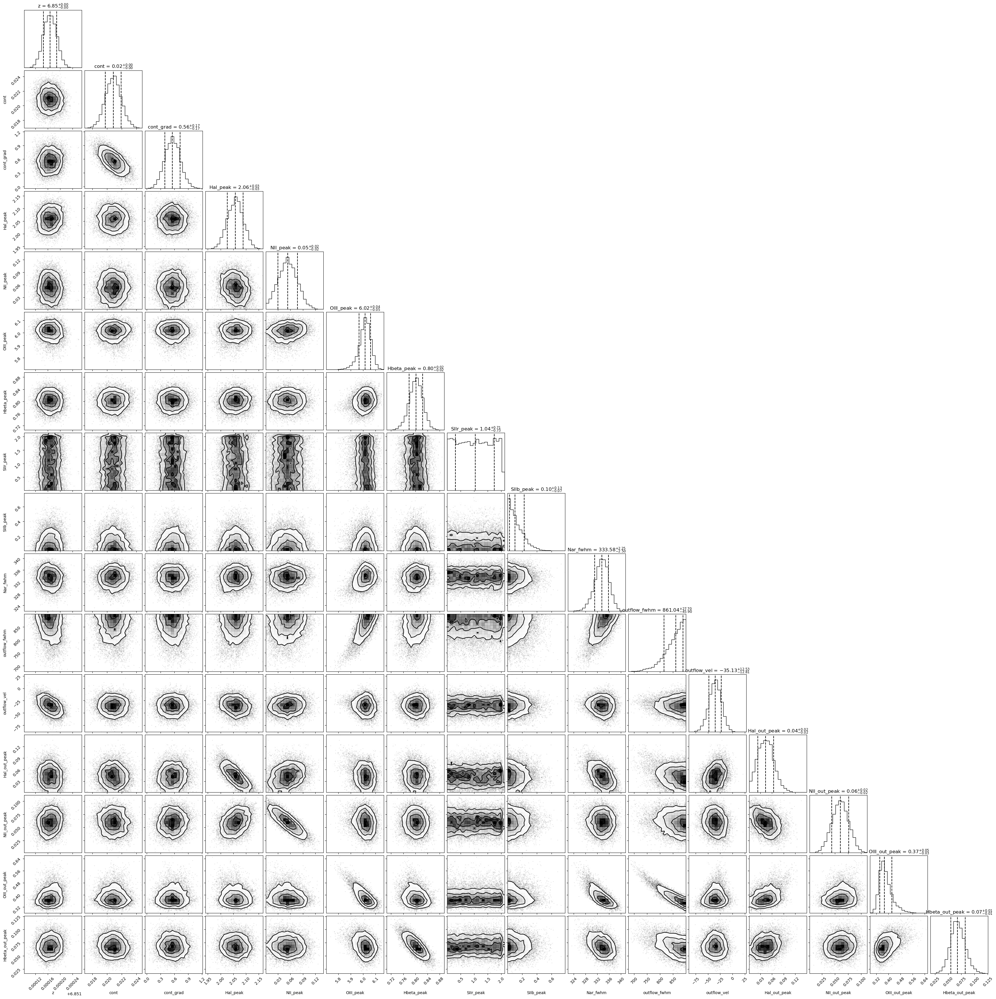

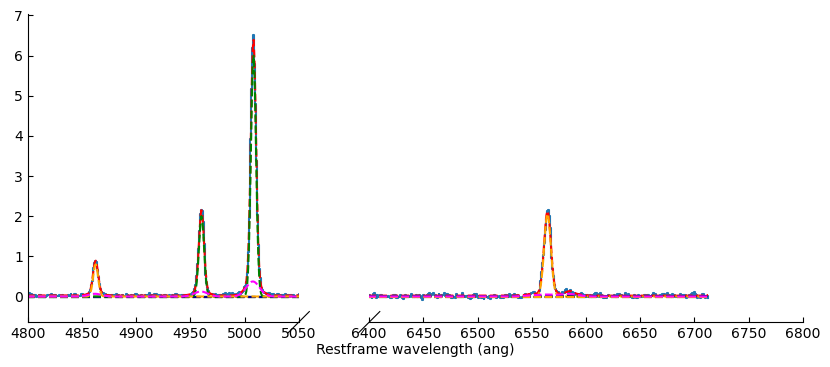

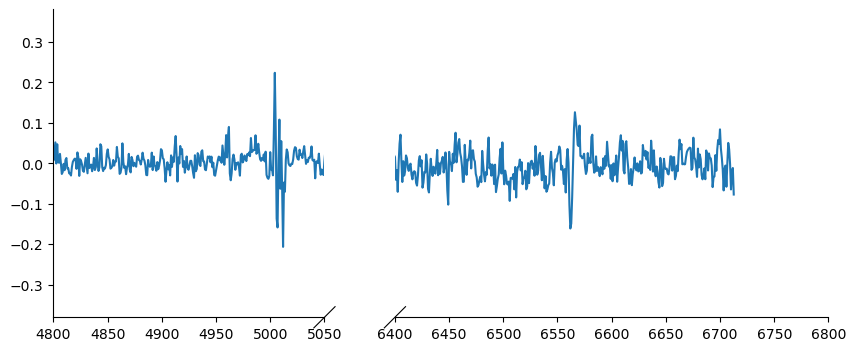

In [26]:
Cube.fitting_collapse_Halpha_OIII(models='Outflow_only', plot=1)

plt.show()

In [27]:
Cube.D1_fit_results

{'name': 'Halpha_OIII',
 'z': array([6.85116733e+00, 2.07704253e-05, 2.12972068e-05]),
 'cont': array([0.02085114, 0.001077  , 0.00107311]),
 'cont_grad': array([0.55701595, 0.16656474, 0.16842309]),
 'Hal_peak': array([2.0587555 , 0.03252833, 0.03030452]),
 'NII_peak': array([0.05327759, 0.02305526, 0.02356127]),
 'OIII_peak': array([6.0168496 , 0.04875054, 0.0425163 ]),
 'Hbeta_peak': array([0.80193792, 0.0224897 , 0.02166783]),
 'SIIr_peak': array([1.03798652, 0.72525138, 0.71020601]),
 'SIIb_peak': array([0.10021541, 0.07315906, 0.12787445]),
 'Nar_fwhm': array([333.57910158,   2.50455588,   2.25491275]),
 'outflow_fwhm': array([861.0428587 ,  45.89639046,  27.69734681]),
 'outflow_vel': array([-35.1333093 ,  12.80914669,  12.52754861]),
 'Hal_out_peak': array([0.04335927, 0.02047595, 0.02106767]),
 'NII_out_peak': array([0.06015394, 0.01615317, 0.01607374]),
 'OIII_out_peak': array([0.37452337, 0.03112812, 0.04837536]),
 'Hbeta_out_peak': array([0.06782907, 0.01279083, 0.01468752]

In [28]:
print(IFU.sp.flux_calc_mcmc( Cube.D1_fit_results,Cube.D1_fit_chain, 'OIIIt', Cube.flux_norm ))


(4.3315344772533074e-17, 2.0390757277808337e-19, 2.204179783483532e-19)


## Fitting Custom Function

In [10]:
def gauss(x, k, mu,FWHM):
    sig = FWHM/3e5*mu/2.35482
    expo= -((x-mu)**2)/(2*sig*sig)

    y= k* e**expo

    return y
from astropy.modeling.powerlaws import PowerLaw1D

def Full_optical(x, z, cont,cont_grad,  Hal_peak, NII_peak, OIIIn_peak, Hbeta_peak, Hgamma_peak, Hdelta_peak, NeIII_peak, OII_peak, OII_rat,OIIIc_peak, HeI_peak,HeII_peak, Nar_fwhm):
    # Halpha side of things
    Hal_wv = 6564.52*(1+z)/1e4
    NII_r = 6585.27*(1+z)/1e4
    NII_b = 6549.86*(1+z)/1e4
    
    OIIIr = 5008.24*(1+z)/1e4
    OIIIb = 4960.3*(1+z)/1e4
    Hbeta = 4862.6*(1+z)/1e4

    Hal_nar = gauss(x, Hal_peak, Hal_wv, Nar_fwhm)
    NII_nar_r = gauss(x, NII_peak, NII_r, Nar_fwhm)
    NII_nar_b = gauss(x, NII_peak/3, NII_b, Nar_fwhm)
    
    Hgamma_wv = 4341.647191*(1+z)/1e4
    Hdelta_wv = 4102.859855*(1+z)/1e4
    
    Hgamma_nar = gauss(x, Hgamma_peak, Hgamma_wv, Nar_fwhm)
    Hdelta_nar = gauss(x, Hdelta_peak, Hdelta_wv, Nar_fwhm)
    
    
    # [OIII] side of things
    OIIIr = 5008.24*(1+z)/1e4
    OIIIb = 4960.3*(1+z)/1e4
    Hbeta = 4862.6*(1+z)/1e4

    OIII_nar = gauss(x, OIIIn_peak, OIIIr, Nar_fwhm) + gauss(x, OIIIn_peak/3, OIIIb, Nar_fwhm)
    Hbeta_nar = gauss(x, Hbeta_peak, Hbeta, Nar_fwhm)
    
    NeIII = gauss(x, NeIII_peak, 3869.68*(1+z)/1e4, Nar_fwhm ) + gauss(x, 0.322*NeIII_peak, 3968.68*(1+z)/1e4, Nar_fwhm)
    
    OII = gauss(x, OII_peak, 3727.1*(1+z)/1e4, Nar_fwhm )  + gauss(x, OII_rat*OII_peak, 3729.875*(1+z)/1e4, Nar_fwhm) 
    
    OIIIc = gauss(x, OIIIc_peak, 4364.436*(1+z)/1e4, Nar_fwhm )
    HeI = gauss(x, HeI_peak, 3889.73*(1+z)/1e4, Nar_fwhm )
    HeII = gauss(x, HeII_peak, 4686.0*(1+z)/1e4, Nar_fwhm )

    contm = PowerLaw1D.evaluate(x, cont,Hal_wv, alpha=cont_grad)

    return contm+Hal_nar+NII_nar_r+NII_nar_b + OIII_nar + Hbeta_nar + Hgamma_nar + Hdelta_nar + NeIII+ OII + OIIIc+ HeI+HeII


In [11]:
dvmax = 1000/3e5*(1+Cube.z)
dvstd = 200/3e5*(1+Cube.z)
priors={'z':[Cube.z,'normal_hat', Cube.z, dvstd, Cube.z-dvmax, Cube.z+dvmax]}
priors['cont']=[0.1,'loguniform', -3,1]
priors['cont_grad']=[0.2,'normal', 0,0.2]
priors['Hal_peak']=[5.,'loguniform', -3,1]
priors['NII_peak']=[0.4,'loguniform', -3,1]
priors['Nar_fwhm']=[300,'uniform', 200,900]
priors['OIII_peak']=[6.,'loguniform', -3,1]
priors['OI_peak']=[1.,'loguniform', -3,1]
priors['HeI_peak']=[1.,'loguniform', -3,1]
priors['HeII_peak']=[1.,'loguniform', -3,1]
priors['Hbeta_peak']=[2,'loguniform', -3,1]
priors['Hgamma_peak'] = [1.,'loguniform',-3,1]
priors['Hdelta_peak'] = [0.5,'loguniform',-3,1]
priors['NeIII_peak'] = [0.3,'loguniform',-3,1]
priors['OII_peak'] = [0.4,'loguniform',-3,1]
priors['OII_rat']=[1,'normal_hat',1,0.2, 0.2,4]
priors['OIIIaur_peak']=[0.2,'loguniform', -3,1]

labels= ['z', 'cont','cont_grad',  'Hal_peak', 'NII_peak', 'OIII_peak', 'Hbeta_peak','Hgamma_peak', 'Hdelta_peak','NeIII_peak','OII_peak','OII_rat','OIIIaur_peak', 'HeI_peak','HeII_peak', 'Nar_fwhm']

use = np.where( ( (Cube.obs_wave> 2.82) | (Cube.obs_wave<3.46) ) & ( (Cube.obs_wave>3.75) | (Cube.obs_wave<4.1) ) & ( (Cube.obs_wave>5) | (Cube.obs_wave<5.3) ) )[0]
if __name__ == '__main__':
    optical = emfit.Fitting(Cube.obs_wave, Cube.D1_spectrum, Cube.D1_spectrum_er,Cube.z, priors=priors, N=5000, ncpu=3) # Cube.obs_wave[use], Cube.D1_spectrum[use], Cube.D1_spectrum_er[use]
    optical.fitting_general( Full_optical, labels, emfit.logprior_general_scipy)
    


100%|██████████| 5000/5000 [02:18<00:00, 36.06it/s]


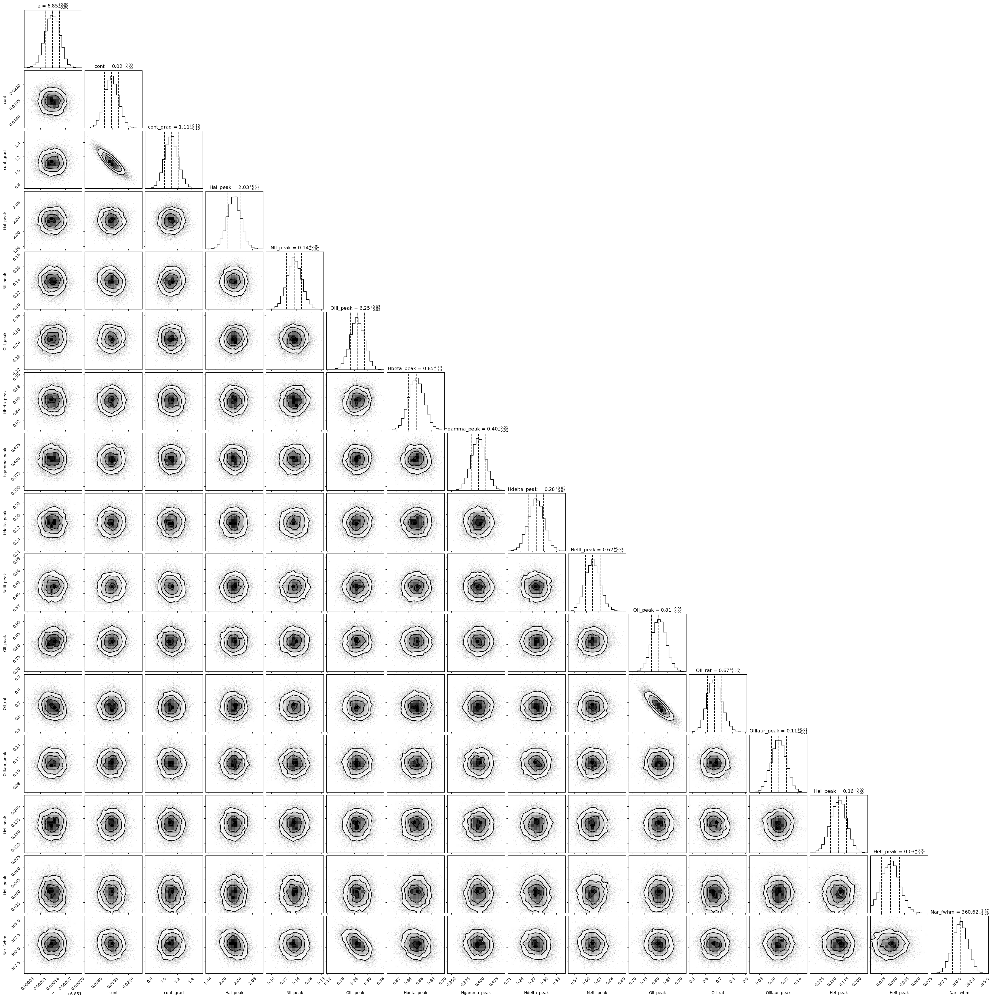

In [12]:
import corner

fig = corner.corner(
            IFU.sp.unwrap_chain(optical.chains), 
            labels = labels,
            quantiles=[0.16, 0.5, 0.84],
            show_titles=True,
            title_kwargs={"fontsize": 12})
#fig.savefig('./corner_full.pdf')
plt.show()

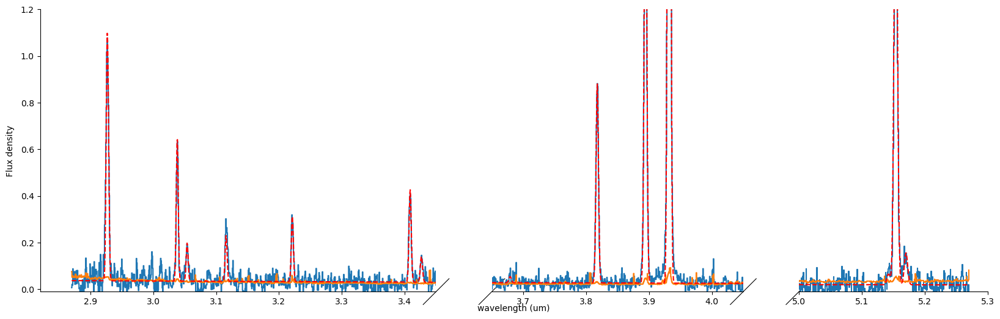

In [79]:
f = plt.figure( figsize=(20,6))
from brokenaxes import brokenaxes
ax = brokenaxes(xlims=((2.820,3.45),(3.65,4.05),(5.0,5.3)),  hspace=.01)

ax.plot(Cube.obs_wave, Cube.D1_spectrum, drawstyle='steps-mid')
ax.plot(Cube.obs_wave, Cube.D1_spectrum_er, drawstyle='steps-mid')

ax.plot(Cube.obs_wave, Full_optical(Cube.obs_wave, *optical.props['popt']), 'r--')

ax.set_xlabel('wavelength (um)')
ax.set_ylabel('Flux density')

ax.set_ylim(-0.01, 1.2)

plt.show()

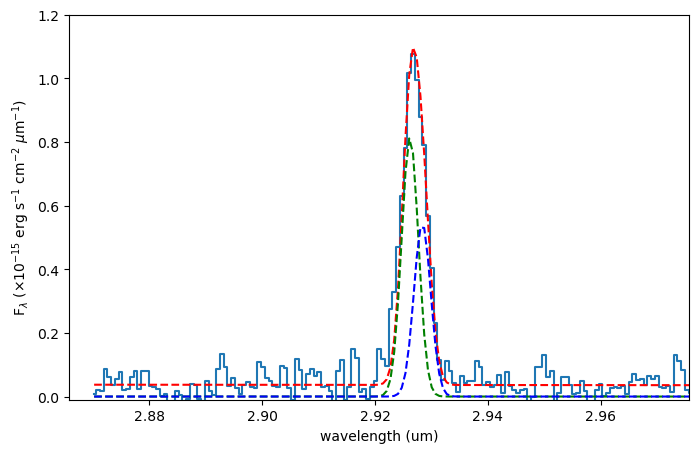

In [80]:
f,ax= plt.subplots(1, figsize=(8,5))

ax.plot(Cube.obs_wave, Cube.D1_spectrum, drawstyle='steps-mid')
ax.plot(Cube.obs_wave, Full_optical(Cube.obs_wave, *optical.props['popt']), 'r--')

OII_peak = optical.props['OII_peak'][0]
OII_rat = optical.props['OII_rat'][0]
zoii=optical.props['z'][0]

OII3727 = gauss(Cube.obs_wave, OII_peak, 3727.1*(1+zoii)/1e4, optical.props['Nar_fwhm'][0])  
OII3729 = gauss(Cube.obs_wave, OII_rat*OII_peak, 3729.875*(1+zoii)/1e4,optical.props['Nar_fwhm'][0] ) 

ax.plot(Cube.obs_wave, OII3727, 'g--')
ax.plot(Cube.obs_wave, OII3729, 'b--')


ax.set_xlim(3650.1*(1+zoii)/1e4, 3790.1*(1+zoii)/1e4)

ax.set_xlabel('wavelength (um)')
ax.set_ylabel(r'F$_\lambda$ ($\times 10^{-15}$ erg s$^{-1}$ cm$^{-2}$ $\mu$m$^{-1}$)')

ax.set_ylim(-0.01, 1.2)

plt.show()

### Flux Calc

In [96]:
print('[OIII] flux from custom', IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=5008, peak_name='OIII_peak', fwhm_name='Nar_fwhm' ))
print('Hbeta flux from custom', IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=4861, peak_name='Hbeta_peak', fwhm_name='Nar_fwhm' ))
print('[NII] flux from custom',IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=6587, peak_name='NII_peak', fwhm_name='Nar_fwhm' ))
print('Halpha flux from custom',IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=6563, peak_name='Hal_peak', fwhm_name='Nar_fwhm' ))
print('[OIII]4363 flux from custom',IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=4363, peak_name='OIIIaur_peak', fwhm_name='Nar_fwhm' ))

print('[OII]3727 flux from custom',IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=3727, peak_name='OII_peak', fwhm_name='Nar_fwhm', ratio_name='' ))
print('[OII]3729 flux from custom',IFU.sp.flux_calc_mcmc(optical.props,optical.chains, 'general', Cube.flux_norm, wv_cent=3729, peak_name='OII_peak', fwhm_name='Nar_fwhm', ratio_name='OII_rat' ))

[OIII] flux from custom (3.1387569107604056e-17, 1.3718507995246631e-19, 1.3353784562299313e-19)
Hbeta flux from custom (4.1602221835920534e-18, 6.035833525769391e-20, 6.419844226378108e-20)
[NII] flux from custom (9.001025693275915e-19, 7.694436091530411e-20, 7.929111700076085e-20)
Halpha flux from custom (1.3376432772965773e-17, 1.2805384220949435e-19, 1.2550188320000215e-19)
[OIII]4363 flux from custom (4.809987819015428e-19, 5.1134461398169567e-20, 4.953209981348708e-20)
[OII]3727 flux from custom (3.0426013718450658e-18, 1.2015302705274191e-19, 1.1657934436713213e-19)
[OII]3729 flux from custom (2.0377102495909775e-18, 1.1767819816366564e-19, 1.1218929393300842e-19)


## Fitting a custom model by passing a dictionary of components

Very highly experimental, still under development, use at your risk!

In [12]:
dvmax = 1000/3e5*(1+Cube.z)
dvstd = 200/3e5*(1+Cube.z)

model_inputs = {}
model_inputs["m_z"] = [Cube.z, ['normal_hat', Cube.z, dvstd, Cube.z-dvmax, Cube.z+dvmax]]
model_inputs["m_fwhm_nr"] = [400, ['uniform' , 100, 900]]
model_inputs["m_ContSlope"] = [0.001, ['normal', 0, 1]]
model_inputs["m_ContNorm"] = [0.1, ['loguniform', -3, 1]]

#model_inputs["m_fwhm_br"] = [700, ['uniform', 400, 1200]]

model_inputs["l_nr_Ha_peak"]= [1, ['loguniform', -3, 1]]
model_inputs["l_nr_Ha_wav"] = [0.656452255]

model_inputs["l_nr_Hb_peak"]= [1, ['loguniform', -3, 1]]
model_inputs["l_nr_Hb_wav"] = [0.4861]

model_inputs["l_nr_Hg_peak"]= [1, ['loguniform', -3, 1]]
model_inputs["l_nr_Hg_wav"] = [0.4341647191]

model_inputs["l_nr_Hd_peak"]= [1, ['loguniform', -3, 1]]
model_inputs["l_nr_Hd_wav"] = [0.410285985]

model_inputs["l_nr_HeI_peak"]= [1, ['loguniform', -3, 1]]
model_inputs["l_nr_HeI_wav"] = [0.388973]

model_inputs["l_nr_OIIIc_peak"]= [1,['loguniform', -3, 1]]
model_inputs["l_nr_OIIIc_wav"] = [0.43640436]

model_inputs["d_nr_NeIII_wav1"] = [0.386968]
model_inputs["d_nr_NeIII_wav2"] = [0.396868]
model_inputs["d_nr_NeIII_peak1"] = [1.0,['loguniform', -3, 1]]
model_inputs["d_nr_NeIII_ratio"] = [3.1055]

model_inputs["d_nr_NII_wav1"] = [0.6585273]
model_inputs["d_nr_NII_wav2"] = [0.654986]
model_inputs["d_nr_NII_peak1"] = [0.1,['loguniform', -3, 1]]
model_inputs["d_nr_NII_ratio"] = [3]

model_inputs["d_nr_OIII_wav1"] = [0.5008]
model_inputs["d_nr_OIII_wav2"] = [0.4960]
model_inputs["d_nr_OIII_peak1"] = [1,['loguniform', -3,1]]
model_inputs["d_nr_OIII_ratio"] = [2.99]
'''
model_inputs["d_nr_OII_wav1"] = [0.3727]
model_inputs["d_nr_OII_wav2"] = [0.3729]
model_inputs["d_nr_OII_peak1"] = [0.9,['loguniform', -3, 1]]
model_inputs["d_nr_OII_ratio"] = [1,['uniform',0.2, 4]]
'''

if __name__ == '__main__':
    optical_cus = emfit.Fitting(Cube.obs_wave, Cube.D1_spectrum, Cube.D1_spectrum_er,Cube.z, priors=priors, N=5000, ncpu=1) # Cube.obs_wave[use], Cube.D1_spectrum[use], Cube.D1_spectrum_er[use]
    optical_cus.fitting_custom(model_inputs, model_name='test')



100%|██████████| 5000/5000 [04:31<00:00, 18.41it/s]


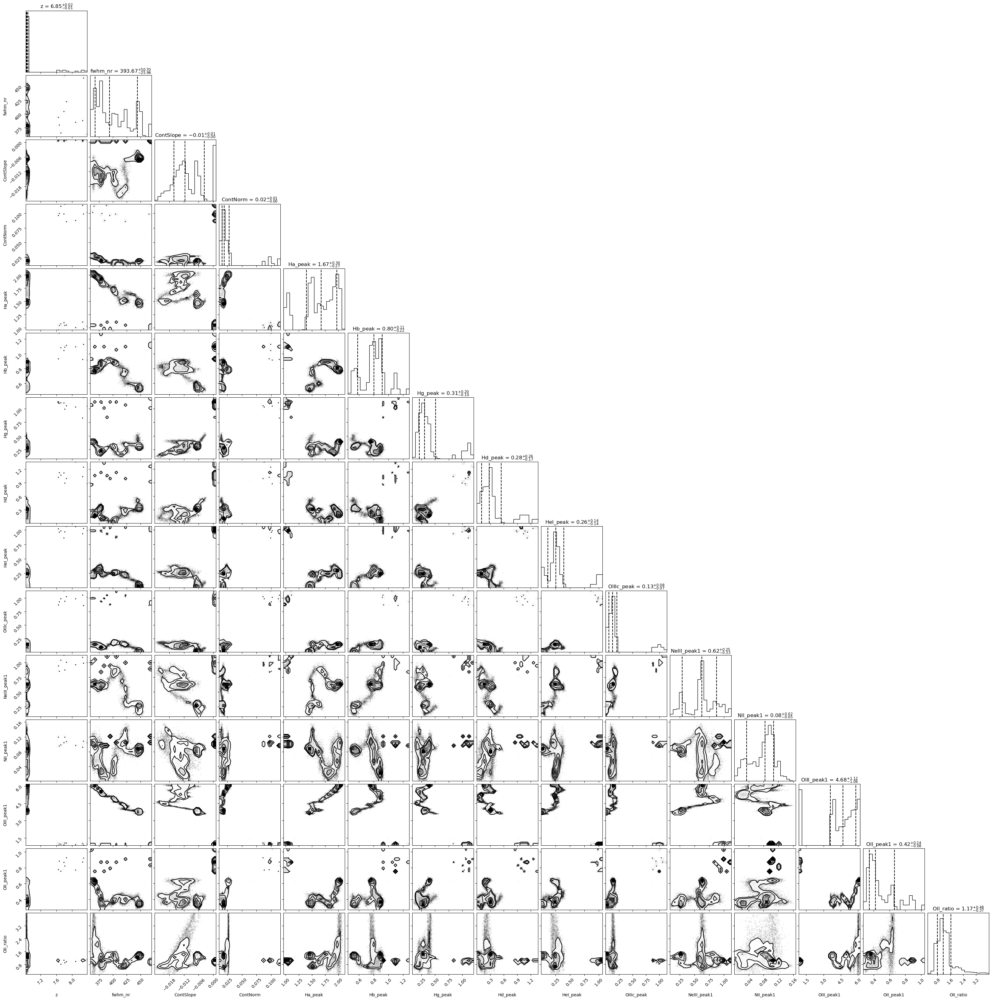

In [11]:
import corner

fig = corner.corner(
            IFU.sp.unwrap_chain(optical_cus.chains), 
            labels = optical_cus.labels,
            quantiles=[0.16, 0.5, 0.84],
            show_titles=True,
            title_kwargs={"fontsize": 12})
#fig.savefig('~/corner_full.pdf')
plt.show()

In [94]:
optical_cus.Model.lines['Ha'].width_type

'nr'

{'name': 'test', 'z': array([6.85113479, 0.01288934, 0.01399808]), 'fwhm_nr': array([361.01504279,  18.45834857,  69.51931887]), 'ContSlope': array([-0.00226402,  0.00170361,  0.0024401 ]), 'ContNorm': array([0.02712003, 0.00218998, 0.00207287]), 'Ha_peak': array([1.78952719, 0.25316141, 0.33242956]), 'Hb_peak': array([0.66430991, 0.12148011, 0.19711134]), 'Hg_peak': array([1.1628607 , 0.6091248 , 0.32145797]), 'Hd_peak': array([0.5806407 , 0.199163  , 0.14328775]), 'HeI_peak': array([0.33875543, 0.28324308, 0.14669357]), 'OIIIc_peak': array([0.06361744, 0.05326112, 0.08012716]), 'NeIII_peak1': array([0.48224191, 0.09489346, 0.06464618]), 'NII_peak1': array([0.25098434, 0.14262701, 0.08246774]), 'OIII_peak1': array([4.60455687, 0.99789878, 1.61426407]), 'OII_peak1': array([0.3785235 , 0.09779695, 0.15869421]), 'OII_ratio': array([1.22725442, 0.88312477, 0.74362428]), 'popt': [6.851134788317879, 361.0150427882427, -0.002264018911122401, 0.027120028735651606, 1.789527190297178, 0.6643099

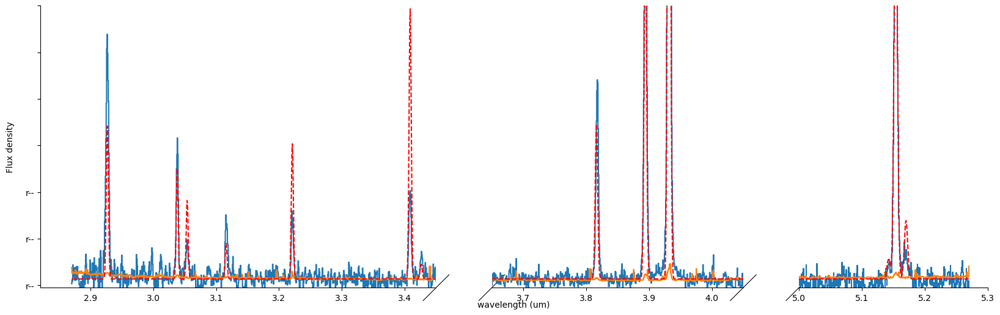

In [84]:
f = plt.figure( figsize=(20,6))
from brokenaxes import brokenaxes
ax = brokenaxes(xlims=((2.820,3.45),(3.65,4.05),(5.0,5.3)),  hspace=.01)

ax.plot(optical_cus.wave, optical_cus.fluxs, drawstyle='steps-mid')
ax.plot(Cube.obs_wave, Cube.D1_spectrum_er, drawstyle='steps-mid')

ax.plot(optical_cus.wave, optical_cus.yeval, 'r--', 'r--')

ax.set_xlabel('wavelength (um)')
ax.set_ylabel('Flux density')

ax.set_ylim(-0.01, 1.2)

print(optical_cus.props)

plt.show()

# Regional Spectra

In [ ]:
from brokenaxes import brokenaxes
mask= IFU.sp.QFitsview_mask(PATH+'COS30_IFS/Data/R2700_main.fits')

Flux_main, Flux_er_main, mask_main = Cube.Regional_Spec(center=[19,24],manual_mask=mask, rad=0.3,err_range=[3.95,4.05, 5,5.1], boundary=4.1)

#Flux_er_main[np.where(Flux_er_main==0)[0]]=1
#use = np.where( ( (Cube.obs_wave> 2.82) | (Cube.obs_wave<3.46) ) & ( (Cube.obs_wave>3.75) | (Cube.obs_wave<4.1) ) & ( (Cube.obs_wave>5) | (Cube.obs_wave<5.3) ) )[0]

optical_main = emfit.Fitting(Cube.obs_wave, Flux_main, Flux_er_main,Cube.z, priors=priors, N=5000)
optical_main.fitting_general( Full_optical, labels, emfit.logprior_general)

sol = optical_main.props
fitted_model = Full_optical


In [ ]:
f = plt.figure( figsize=(20,6))
from brokenaxes import brokenaxes
ax = brokenaxes(xlims=((2.820,3.45),(3.75,4.05),(5,5.3)),  hspace=.01)

ax.plot(Cube.obs_wave, Flux_main, drawstyle='steps-mid')
ax.plot(Cube.obs_wave, Full_optical(Cube.obs_wave, *optical_main.props['popt']), 'r--')

ax.set_xlabel('wavelength (um)')
ax.set_ylabel('Flux density')

ax.set_ylim(-0.01, 1.2)

f,ax =plt.subplots(1)
ax.imshow(Cube.Median_stack_white, origin='lower',vmin=Cube.Median_stack_white.max()*0.01, vmax=Cube.Median_stack_white.max()*0.2)
mask_plot = mask_main[0,:,:].copy()
mask_plot[mask_plot==True] = 1
mask_plot[mask_plot==False]= 0
ax.contour(mask_plot, colors='red', linewidths=1.0, levels=(0.))

mask_comp = mask_plot.copy()

sol['Flux_Halpha'] = IFU.sp.flux_calc_mcmc(optical_main.props,optical_main.chains, 'Han', Cube.flux_norm)
sol['Flux_NII'] = IFU.sp.flux_calc_mcmc(optical_main.props,optical_main.chains, 'NII', Cube.flux_norm)
sol['Flux_OIII'] = IFU.sp.flux_calc_mcmc(optical_main.props, optical_main.chains, 'OIIIt', Cube.flux_norm)
sol['Flux_Hb'] = IFU.sp.flux_calc_mcmc(optical_main.props,optical_main.chains, 'Hbeta', Cube.flux_norm)

print(sol)
print('Flux Halpha ', sol['Flux_Halpha'])
print('Flux NII ', sol['Flux_NII'])
print('Flux OIII ', sol['Flux_OIII'])
print('Flux hbeta', sol['Flux_Hb'])

plt.show()

# Spaxel by Spaxel fitting

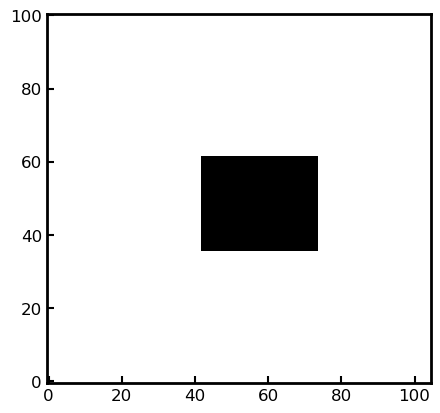

In [20]:
mask_spaxel = IFU.sp.QFitsview_mask(QubeSpec_setup['Spaxel_mask'])

plt.figure()
plt.imshow(mask_spaxel, cmap='gray', origin='lower')
plt.show()

## Unwrapping

6.000000000000038


100%|██████████| 101/101 [16:07<00:00,  9.58s/it]

832


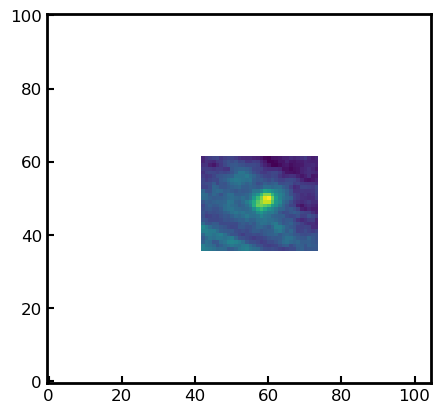

In [29]:
Unwrapping = False
if Unwrapping==True:
    Cube.unwrap_cube(rad=0.3, instrument='NIRSPEC05',mask_manual=mask_spaxel, err_range=QubeSpec_setup['err_range'], boundary=QubeSpec_setup['err_boundary'],, add='') 
plt.show()

In [21]:
priors={'z':[Cube.z,'normal_hat', Cube.z, 0.001, Cube.z-0.05, Cube.z+0.05]}
priors['cont']=[0.001,'loguniform', -4,1]
priors['cont_grad']=[0.1,'normal', 0,0.2]
priors['Hal_peak']=[0.1,'loguniform', -4,1]
priors['NII_peak']=[0.4,'loguniform', -4,1]
priors['Nar_fwhm']=[300,'uniform', 200,900]
priors['OIII_peak']=[0.1,'loguniform', -4,1]
priors['OI_peak']=[0.01,'loguniform', -4,1]
priors['HeI_peak']=[0.01,'loguniform', -4,1]
priors['Hbeta_peak']=[0.02,'loguniform', -4,1]
priors['Hgamma_peak'] = [0.02,'loguniform',-4,1]
priors['Hdelta_peak'] = [0.01,'loguniform',-4,1]
priors['NeIII_peak'] = [0.01,'loguniform',-4,1]
priors['OII_peak'] = [0.01,'loguniform',-4,1]
priors['OII_rat']=[1,'uniform', 0.2,4]
priors['OIIIc_peak']=[0.01,'loguniform', -4,1]

Spaxel = False
if Spaxel==True: 
    if __name__ == '__main__':
        IFU.Spaxel.Spaxel_fitting_general_MCMC_mp(Cube, Full_optical,labels, priors, emfit.logprior_general_scipy, add='', Ncores=QubeSpec_setup['ncpu'])


import of the unwrap cube - done


100%|██████████| 9/9 [11:11<00:00, 74.64s/it] 

--- Cube fitted in 671.8387620449066 seconds ---


### Generating the maps

In [73]:
info = {'Hal': {'wv':6563,'fwhm':'Nar_fwhm','kin':1}}
info['NII'] = {'wv':6583, 'fwhm':'Nar_fwhm','kin':0}
info['OIII'] = {'wv':5008, 'fwhm':'Nar_fwhm','kin':1}
info['Hbeta'] = {'wv':4861, 'fwhm':'Nar_fwhm','kin':0}
info['Hgamma'] = {'wv':4341.647, 'fwhm':'Nar_fwhm','kin':0}
info['Hdelta'] = {'wv':4102.859, 'fwhm':'Nar_fwhm','kin':0}
info['NeIII'] = {'wv':3869.68, 'fwhm':'Nar_fwhm','kin':0}
info['OII'] = {'wv':3727.1, 'fwhm':'Nar_fwhm','kin':0}
info['OIIIc'] = {'wv':4363, 'fwhm':'Nar_fwhm','kin':0}
info['HeI'] = {'wv':3889, 'fwhm':'Nar_fwhm','kin':0}

fmaps = IFU.Maps.Map_creation_general(Cube, info,flux_max=1e-18, SNR_cut=4., fwhmrange=[200,600], velrange=[-200,200], \
                                  modelfce=Full_optical )
plt.show()

True


100%|██████████| 832/832 [22:24<00:00,  1.62s/it]


Failed fits 0


# Other Utilities

## PSF matching of the cube

In [30]:
Cube.PSF_matching(wv_ref=Cube.obs_wave[-1])

True


3610it [00:29, 123.41it/s]
